# Problem Statements

# About the data: 
- Let’s consider a Company dataset with around 10 variables and 400 records. 
- The attributes are as follows: 
- Sales -- Unit sales (in thousands) at each location
- Competitor Price -- Price charged by competitor at each location
- Income -- Community income level (in thousands of dollars)
- Advertising -- Local advertising budget for company at each location (in thousands of dollars)
- Population -- Population size in region (in thousands)
- Price -- Price company charges for car seats at each site
- Shelf Location at stores -- A factor with levels Bad, Good and Medium indicating the quality of the shelving location for the car seats at each site
- Age -- Average age of the local population
- Education -- Education level at each location
- Urban -- A factor with levels No and Yes to indicate whether the store is in an urban or rural location
- US -- A factor with levels No and Yes to indicate whether the store is in the US or not
- The company dataset looks like this: 

# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['figure.dpi'] = 500
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_csv("Company_Data.csv")
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


# EDA (Exploratory Data Analysis)

- Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques and statistical techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

- Steps involved in EDA

- Describing the data
- Data cleaning
- Imputation techniques
- Data analysis and visualization
- Transformations
- Auto EDA

In [3]:
df.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


# Check Null Values

In [4]:
df.isnull().sum()

Sales          0
CompPrice      0
Income         0
Advertising    0
Population     0
Price          0
ShelveLoc      0
Age            0
Education      0
Urban          0
US             0
dtype: int64

In [5]:
df.describe(include=object)

,ShelveLoc,Urban,US
count,400,400,400
unique,3,2,2
top,Medium,Yes,Yes
freq,219,282,258


# See the above they are no null values are there

In [6]:
df.dtypes

Sales          float64
CompPrice        int64
Income           int64
Advertising      int64
Population       int64
Price            int64
ShelveLoc       object
Age              int64
Education        int64
Urban           object
US              object
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


# Check The Duplicated Values

In [8]:
df.duplicated().sum()

0

# Print the duplicated values

In [9]:
df[df.duplicated()]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US


# Data visualization

In [10]:
sns.pairplot(df)

In [11]:
df.groupby(['ShelveLoc','Urban','US']).count()

Sales  CompPrice  Income  Advertising  Population  Price  \
ShelveLoc Urban US                                                              
Bad       No    No      11         11      11           11          11     11   
                Yes     11         11      11           11          11     11   
          Yes   No      23         23      23           23          23     23   
                Yes     51         51      51           51          51     51   
Good      No    No       6          6       6            6           6      6   
                Yes     22         22      22           22          22     22   
          Yes   No      18         18      18           18          18     18   
                Yes     39         39      39           39          39     39   
Medium    No    No      29         29      29           29          29     29   
                Yes     39         39      39           39          39     39   
          Yes   No      55         55      55           55          55     55   
                Yes     96         96      96           96          96     96   

                     Age  Education  
ShelveLoc Urban US                   
Bad       No    No    11         11  
                Yes   11         11  
          Yes   No    23         23  
                Yes   51         51  
Good      No    No     6          6  
                Yes   22         22  
          Yes   No    18         18  
                Yes   39         39  
Medium    No    No    29         29  
                Yes   39         39  
          Yes   No    55         55  
                Yes   96         96

# Label Encoding

In [12]:
from sklearn import preprocessing

In [13]:
label_encoder = preprocessing.LabelEncoder()
df['ShelveLoc']= label_encoder.fit_transform(df['ShelveLoc']) 
df['Urban']= label_encoder.fit_transform(df['Urban'])
df['US']= label_encoder.fit_transform(df['US'])

In [14]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,0,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,1,33,14,1,1
396,6.14,139,23,3,37,120,2,55,11,0,1
397,7.41,162,26,12,368,159,2,40,18,1,1
398,5.94,100,79,7,284,95,0,50,12,1,1


In [15]:
df.dtypes

Sales          float64
CompPrice        int64
Income           int64
Advertising      int64
Population       int64
Price            int64
ShelveLoc        int32
Age              int64
Education        int64
Urban            int32
US               int32
dtype: object

# Data type conversion

In [16]:
df['ShelveLoc'] = df['ShelveLoc'].astype(int)

In [17]:
df['Urban'] = df['Urban'].astype(int)

In [18]:
df['US'] = df['US'].astype(int)

In [19]:
df.dtypes

Sales          float64
CompPrice        int64
Income           int64
Advertising      int64
Population       int64
Price            int64
ShelveLoc        int32
Age              int64
Education        int64
Urban            int32
US               int32
dtype: object

In [20]:
df.corr()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
Sales,1.000000,0.064079,0.151951,0.269507,0.050471,-0.444951,0.157470,-0.231815,-0.051955,-0.015419,0.177093
CompPrice,0.064079,1.000000,-0.080653,-0.024199,-0.094707,0.584848,0.023350,-0.100239,0.025197,0.066594,0.016869
Income,0.151951,-0.080653,1.000000,0.058995,-0.007877,-0.056698,-0.067678,-0.004670,-0.056855,0.037967,0.089601
Advertising,0.269507,-0.024199,0.058995,1.000000,0.265652,0.044537,0.008544,-0.004557,-0.033594,0.042035,0.684460
Population,0.050471,-0.094707,-0.007877,0.265652,1.000000,-0.012144,-0.044772,-0.042663,-0.106378,-0.052025,0.060564
Price,-0.444951,0.584848,-0.056698,0.044537,-0.012144,1.000000,0.014633,-0.102177,0.011747,0.047016,0.057861
ShelveLoc,0.157470,0.023350,-0.067678,0.008544,-0.044772,0.014633,1.000000,0.056488,0.001492,-0.063978,-0.039760
Age,-0.231815,-0.100239,-0.004670,-0.004557,-0.042663,-0.102177,0.056488,1.000000,0.006488,0.028479,0.008652
Education,-0.051955,0.025197,-0.056855,-0.033594,-0.106378,0.011747,0.001492,0.006488,1.000000,-0.033094,-0.078250
Urban,-0.015419,0.066594,0.037967,0.042035,-0.052025,0.047016,-0.063978,0.028479,-0.033094,1.000000,0.047085


<Axes: >

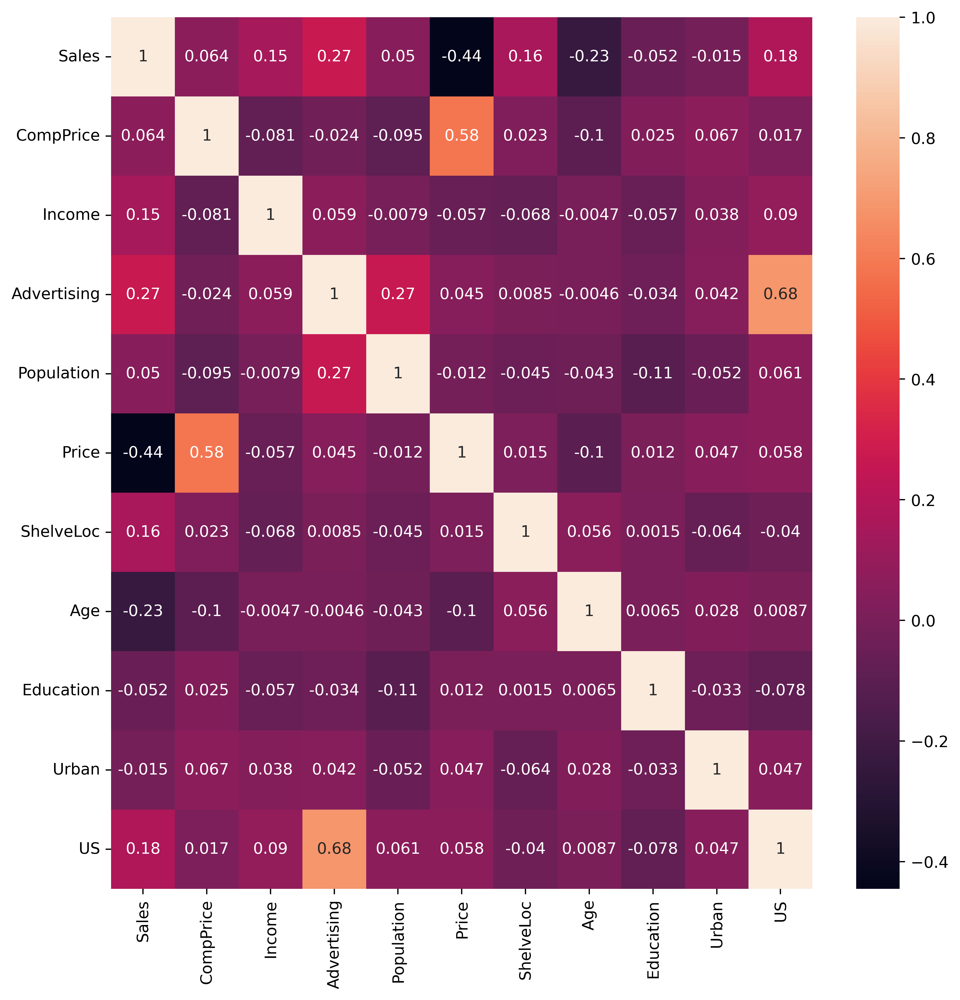

In [21]:
sns.heatmap(df.corr(),annot=True)

# Check Outliers

- There are multiple approaches to detect outliers in the dataset.
- Histogram
- Boxplot
- Descriptive stats for df

In [22]:
df.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,1.307500,53.322500,13.900000,0.705000,0.645000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,0.833475,16.200297,2.620528,0.456614,0.479113
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,0.000000,25.000000,10.000000,0.000000,0.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,1.000000,39.750000,12.000000,0.000000,0.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,2.000000,54.500000,14.000000,1.000000,1.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,2.000000,66.000000,16.000000,1.000000,1.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,2.000000,80.000000,18.000000,1.000000,1.000000


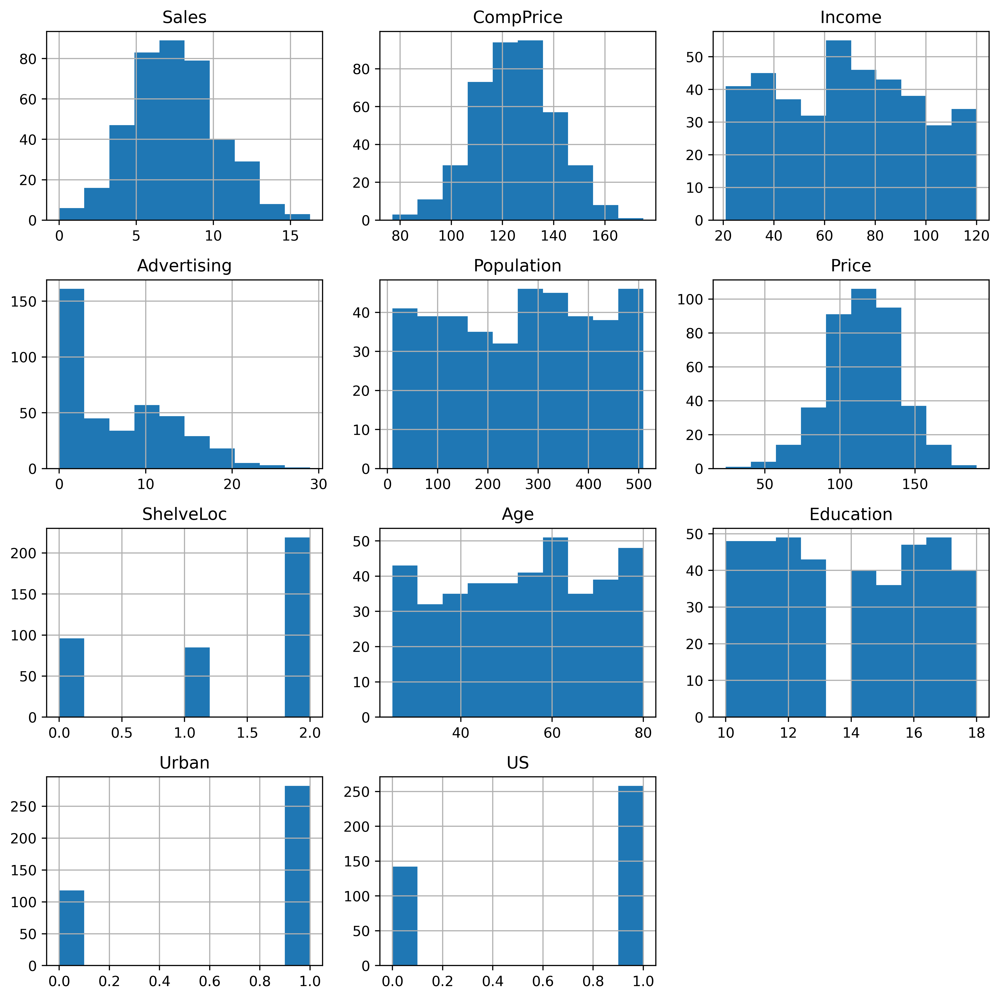

In [23]:
df.hist()
plt.tight_layout()

<Axes: >

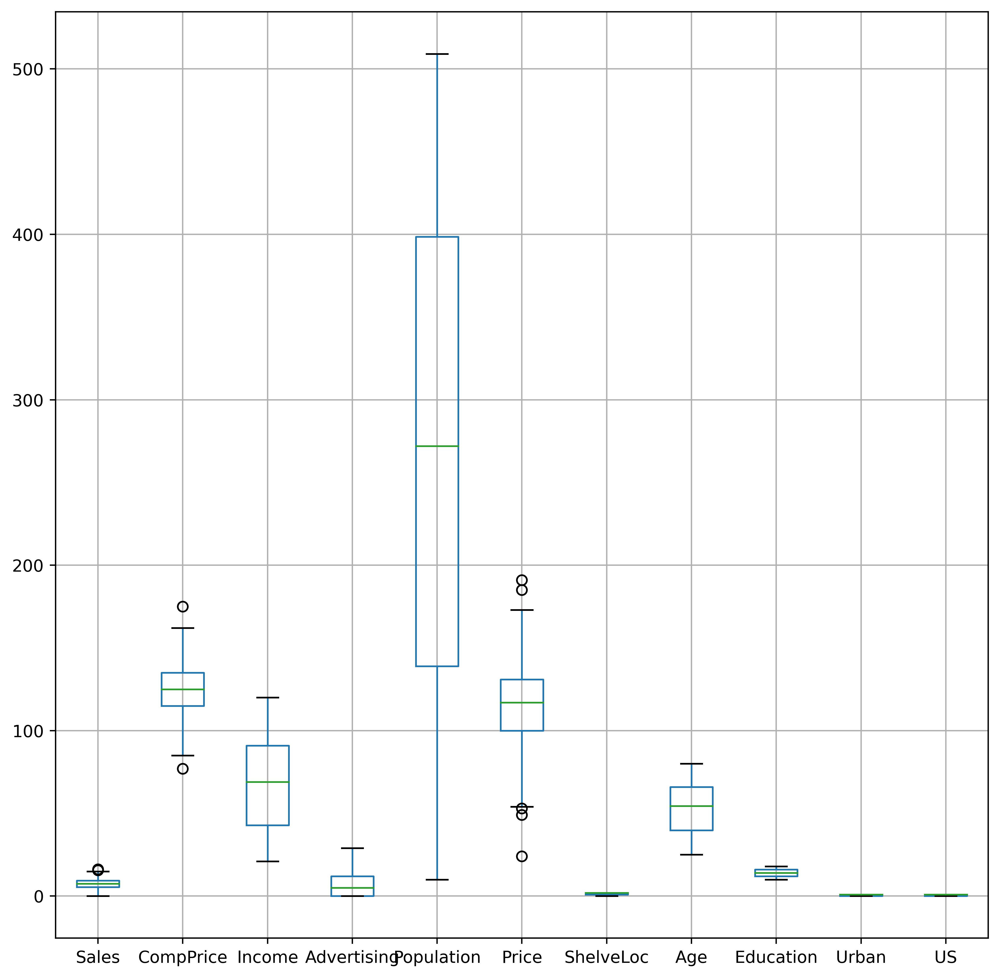

In [24]:
df.boxplot()

# While looking at the above box plot the so many data columns have outlier. Hence, before creating the model we should handle the outilers.

In [25]:
ot=df.copy() 
fig, axes=plt.subplots(11,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='Sales',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='CompPrice',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='Income',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='Advertising',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='Population',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='Price',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='ShelveLoc',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='Age',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='Education',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='Urban',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='US',data=ot,palette='crest',ax=axes[10])
plt.tight_layout(pad=2.0)

# Outlier detection function

In [26]:
def outlier_detection (data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1
    
    upper = q3+1.5*iqr
    lower = q1-1.5*iqr
    
    return lower, upper

In [27]:
outlier_detection(df,"Sales")

(-0.504999999999999, 15.215)

In [28]:
df.loc[df["Sales"]>15.215]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
316,15.63,122,36,5,369,72,1,35,10,1,1
376,16.27,141,60,19,319,92,1,44,11,1,1


Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

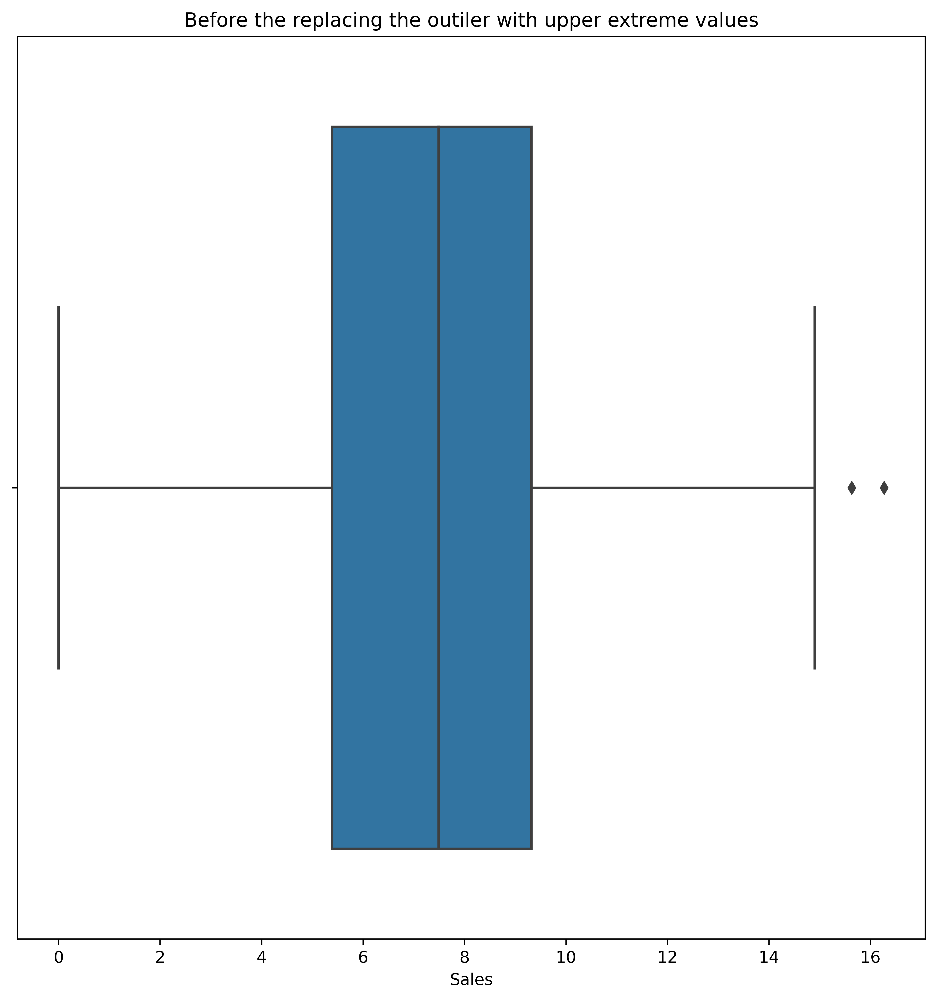

In [29]:
sns.boxplot(x = df["Sales"])
plt.xlabel("Sales")
plt.title("Before the replacing the outiler with upper extreme values")

In [30]:
df.loc[df["Sales"]>15.215, "Sales"] = 15.215

Text(0.5, 1.0, 'After the replaced the outiler with upper extreme values')

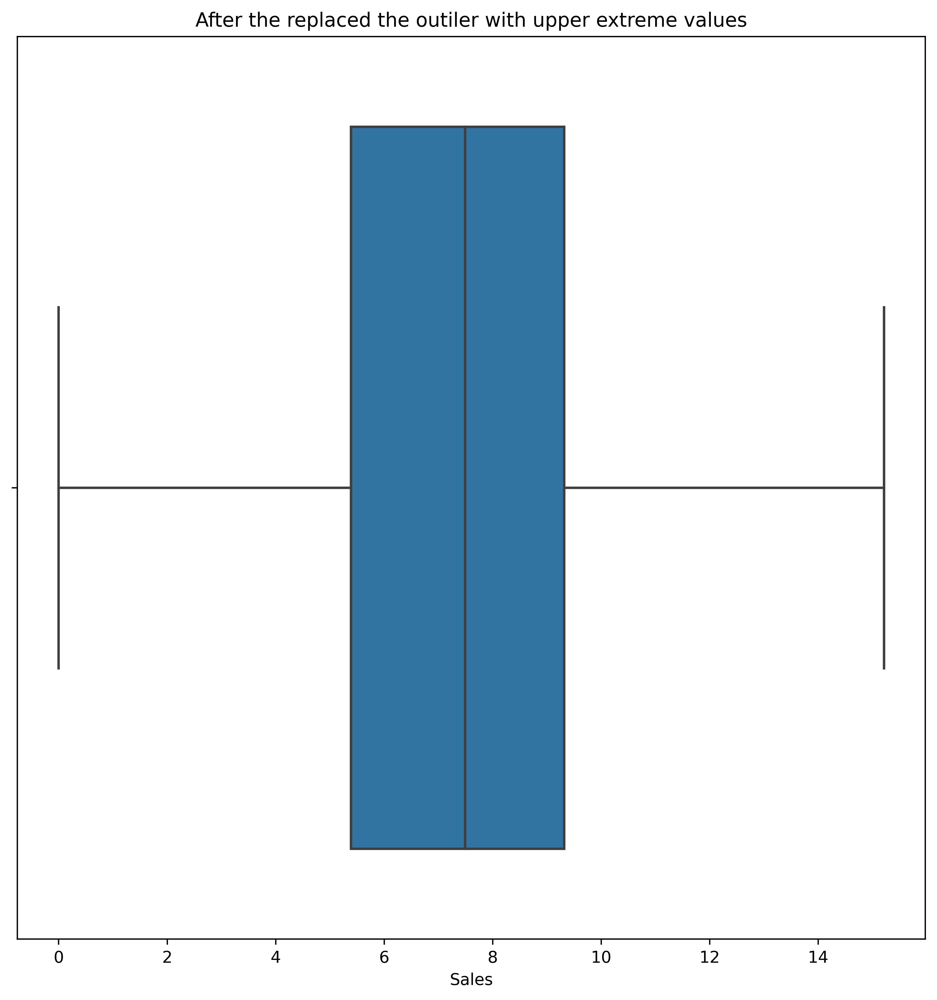

In [31]:
sns.boxplot(x = df["Sales"])
plt.xlabel("Sales")
plt.title("After the replaced the outiler with upper extreme values")

In [32]:
outlier_detection(df,"CompPrice")

(85.0, 165.0)

In [33]:
df.loc[df["CompPrice"]>165.0]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
310,9.53,175,65,29,419,166,2,53,12,1,1


In [34]:
df.loc[df["CompPrice"]<85.0]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
42,10.43,77,69,0,25,24,2,50,18,1,0


Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

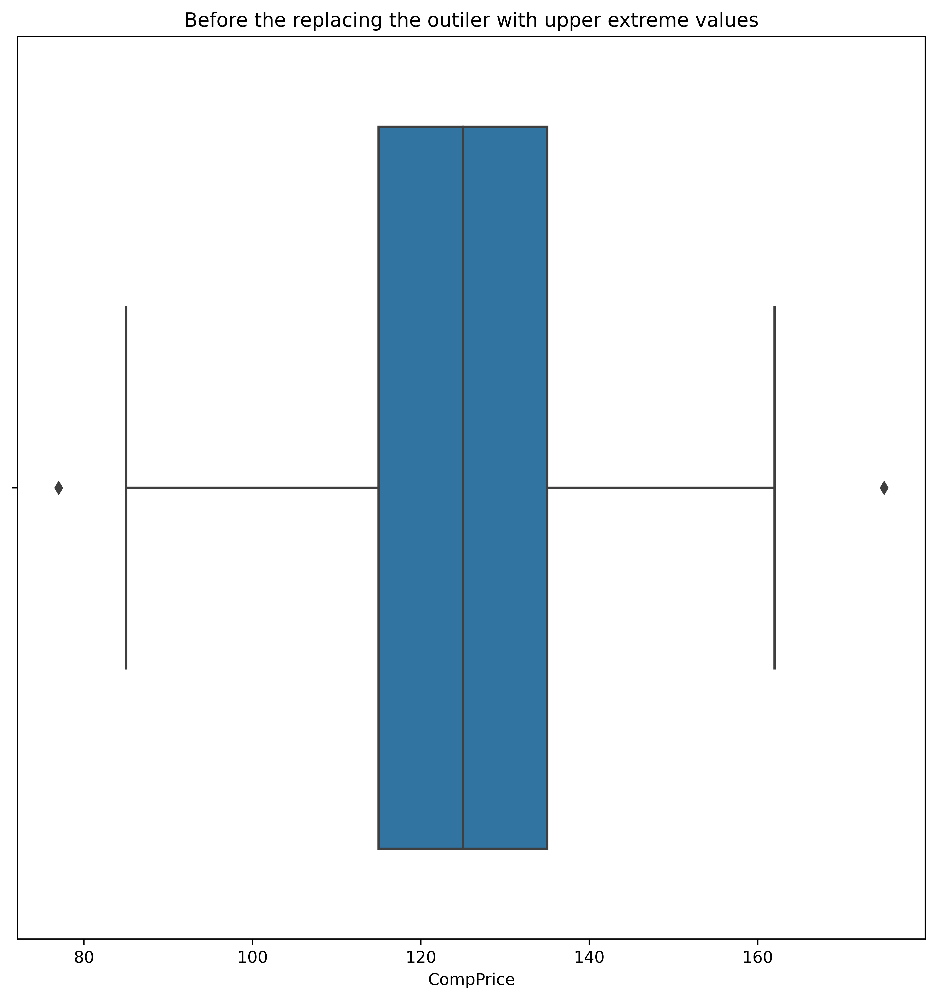

In [35]:
sns.boxplot(x = df["CompPrice"])
plt.xlabel("CompPrice")
plt.title("Before the replacing the outiler with upper extreme values")

In [36]:
df.loc[df["CompPrice"]>165.0, "CompPrice"] = 165.0

In [37]:
df.loc[df["CompPrice"]<85.0, "CompPrice"] = 85.0

Text(0.5, 1.0, 'After the replaced the outiler with upper extreme values')

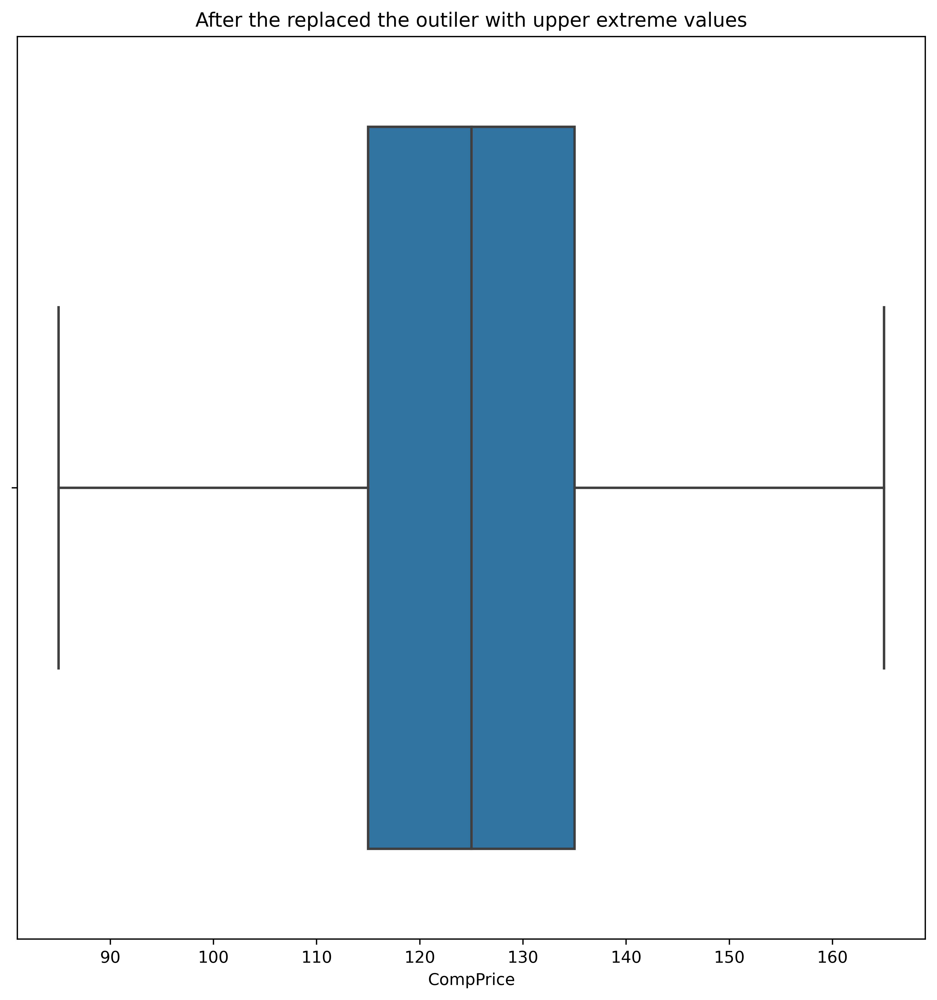

In [38]:
sns.boxplot(x = df["CompPrice"])
plt.xlabel("CompPrice")
plt.title("After the replaced the outiler with upper extreme values")

In [39]:
outlier_detection(df, "Price")

(53.5, 177.5)

In [40]:
df.loc[df["Price"]>177.5]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
165,0.37,147,58,7,100,191,0,27,15,1,1
174,0.00,139,24,0,358,185,2,79,15,0,0


In [41]:
df.loc[df["Price"]<53.5]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
42,10.43,85,69,0,25,24,2,50,18,1,0
125,9.34,89,78,0,181,49,2,43,15,0,0
367,14.37,95,106,0,256,53,1,52,17,1,0


Text(0.5, 1.0, 'Before the replacing the outiler with upper extreme values')

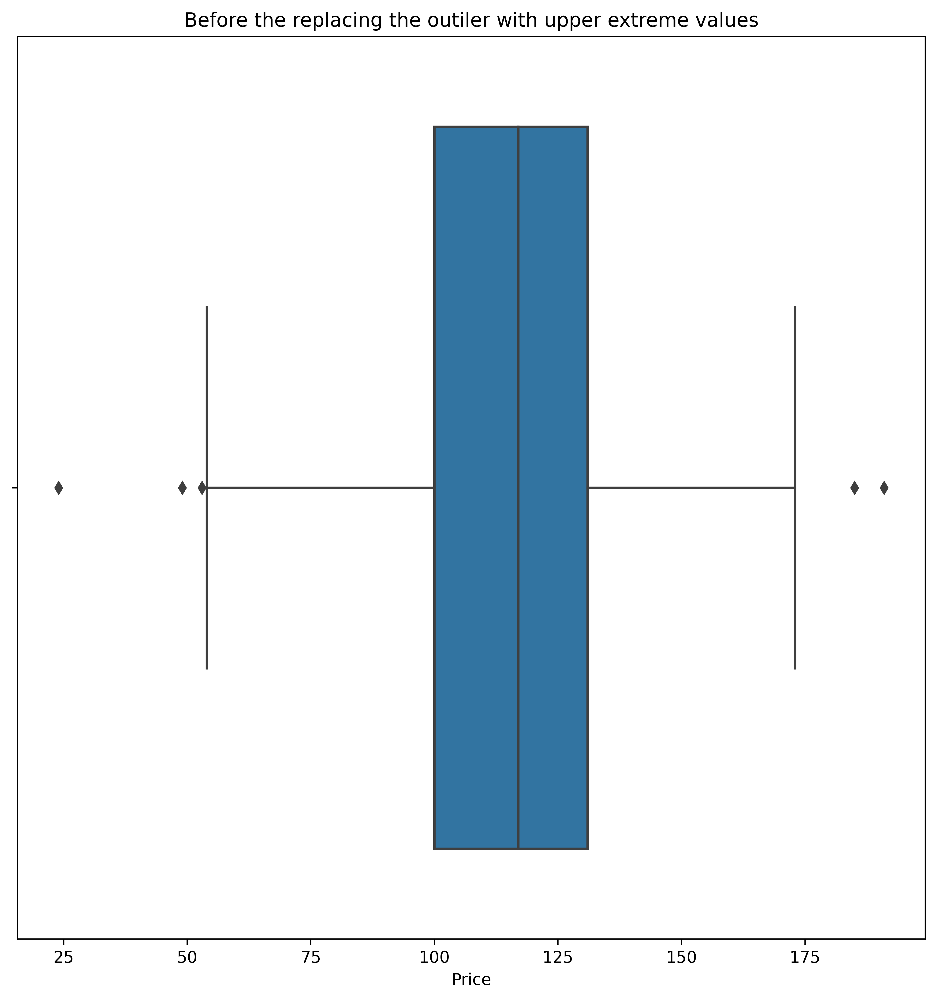

In [42]:
sns.boxplot(x = df["Price"])
plt.xlabel("Price")
plt.title("Before the replacing the outiler with upper extreme values")

In [43]:
df.loc[df["Price"]>177.5, "Price"] = 177.5

In [44]:
df.loc[df["Price"]<53.5, "Price"] = 53.5

Text(0.5, 1.0, 'After the replaced the outiler with upper extreme values')

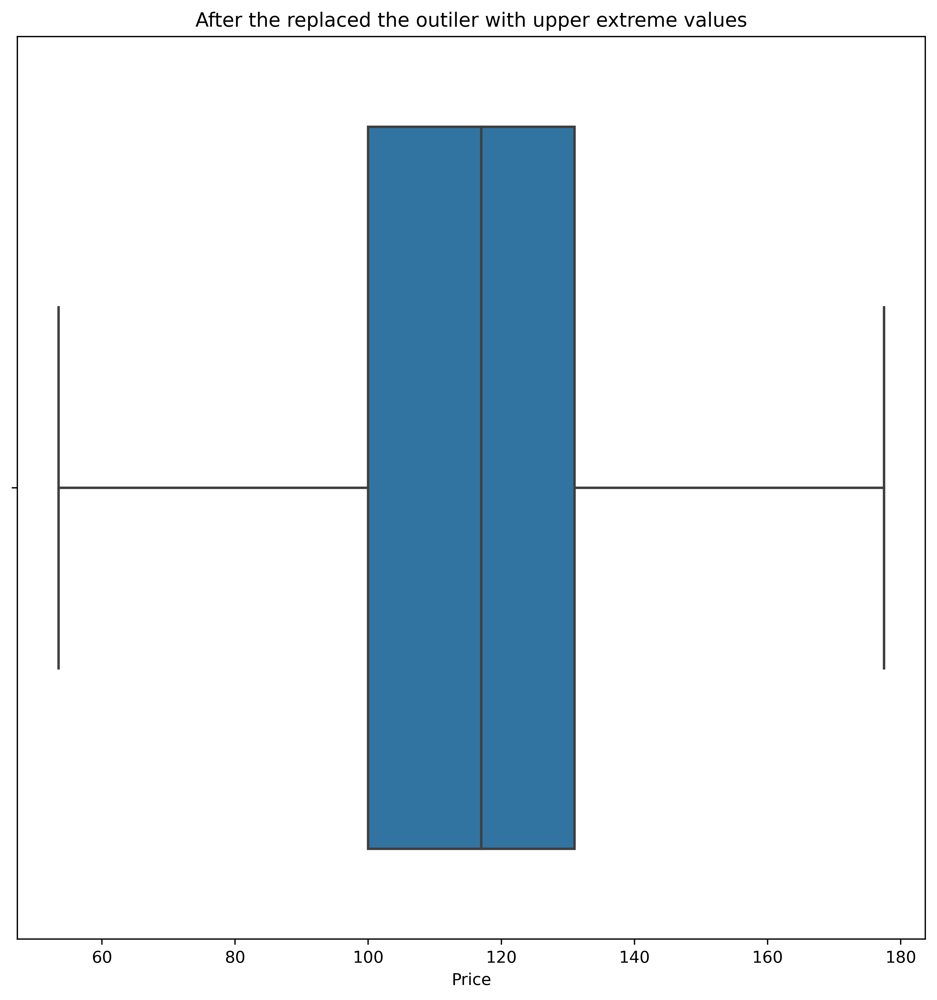

In [45]:
sns.boxplot(x = df["Price"])
plt.xlabel("Price")
plt.title("After the replaced the outiler with upper extreme values")

In [46]:
ot=df.copy() 
fig, axes=plt.subplots(11,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='Sales',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='CompPrice',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='Income',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='Advertising',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='Population',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='Price',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='ShelveLoc',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='Age',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='Education',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='Urban',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='US',data=ot,palette='crest',ax=axes[10])
plt.tight_layout(pad=2.0)

# Now, take a look at the boxplot above; we've handled all of the outliers by replacing them with upper and lower extreme values. Now, above all, the boxplot looks good.

# Before Creating the model we should split the data for traning and testing purpose

In [47]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120.0,0,42,17,1,1
1,11.22,111,48,16,260,83.0,1,65,10,1,1
2,10.06,113,35,10,269,80.0,2,59,12,1,1
3,7.40,117,100,4,466,97.0,2,55,14,1,1
4,4.15,141,64,3,340,128.0,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128.0,1,33,14,1,1
396,6.14,139,23,3,37,120.0,2,55,11,0,1
397,7.41,162,26,12,368,159.0,2,40,18,1,1
398,5.94,100,79,7,284,95.0,0,50,12,1,1


In [48]:
x = df.iloc[:,1:]
y = df['Sales']

In [49]:
x

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,138,73,11,276,120.0,0,42,17,1,1
1,111,48,16,260,83.0,1,65,10,1,1
2,113,35,10,269,80.0,2,59,12,1,1
3,117,100,4,466,97.0,2,55,14,1,1
4,141,64,3,340,128.0,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128.0,1,33,14,1,1
396,139,23,3,37,120.0,2,55,11,0,1
397,162,26,12,368,159.0,2,40,18,1,1
398,100,79,7,284,95.0,0,50,12,1,1


In [50]:
y

0       9.50
1      11.22
2      10.06
3       7.40
4       4.15
       ...  
395    12.57
396     6.14
397     7.41
398     5.94
399     9.71
Name: Sales, Length: 400, dtype: float64

In [51]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2, random_state=42)

In [52]:
xtrain.head()

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
3,117,100,4,466,97.0,2,55,14,1,1
18,110,110,0,408,68.0,1,46,17,0,1
202,121,78,4,413,130.0,0,46,10,0,1
250,137,105,10,435,156.0,1,72,14,1,1
274,135,93,2,67,119.0,2,34,11,1,1


In [53]:
ytrain

3       7.40
18     13.91
202     4.10
250     9.16
274     7.22
       ...  
71      6.50
106     0.16
270    11.99
348    12.57
102     5.30
Name: Sales, Length: 320, dtype: float64

In [54]:
xtest.head()

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
209,98,21,11,326,90.0,0,76,11,0,1
280,121,86,10,496,145.0,0,51,10,1,1
33,114,38,13,317,128.0,1,50,16,1,1
210,125,41,2,357,123.0,0,47,14,0,1
93,145,30,0,67,104.0,2,55,17,1,0


In [55]:
ytest

209     3.02
280     2.86
33      8.77
210     4.36
93      8.86
       ...  
246     6.90
227     8.69
369    10.26
176     5.61
289     8.75
Name: Sales, Length: 80, dtype: float64

# The target columns include more unique values. As a result, it falls within the regression algorithm. As a result, we need to employ the CART decision tree algorithm.

# CART

In [56]:
from sklearn.tree import DecisionTreeRegressor

In [57]:
dtr = DecisionTreeRegressor()

dtr.fit(xtrain,ytrain)
yp = dtr.predict(xtest)
yp

array([ 5.12,  6.8 , 10.62,  4.99, 11.7 ,  5.68, 10.96,  8.01, 11.93,
       11.7 ,  6.54, 10.21,  8.68,  6.52,  9.16,  9.34,  3.58, 12.57,
        6.81,  8.7 ,  9.64,  2.52,  7.96,  7.53,  5.17,  5.64,  8.47,
        6.64,  8.7 ,  4.1 , 11.93, 11.28,  4.69,  4.19, 11.28,  6.93,
        5.31, 10.07,  9.09,  4.99,  1.42,  8.7 ,  9.33,  8.89,  7.02,
        9.32,  7.57,  7.71,  5.98,  6.93, 10.66,  9.32,  8.57, 10.62,
        7.8 ,  5.04,  5.47,  8.21, 11.99,  8.43,  7.8 , 11.28,  5.94,
        5.3 ,  7.95,  5.53, 11.93,  8.68,  8.32, 10.  ,  8.7 ,  5.53,
        8.19,  5.68, 11.18,  6.88, 11.07,  9.39,  6.62,  8.7 ])

In [58]:
dtr.score(xtrain,ytrain), dtr.score(xtest,ytest)

(1.0, 0.46663453907372787)

In [59]:
x.columns

Index(['CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'ShelveLoc', 'Age', 'Education', 'Urban', 'US'],
      dtype='object')

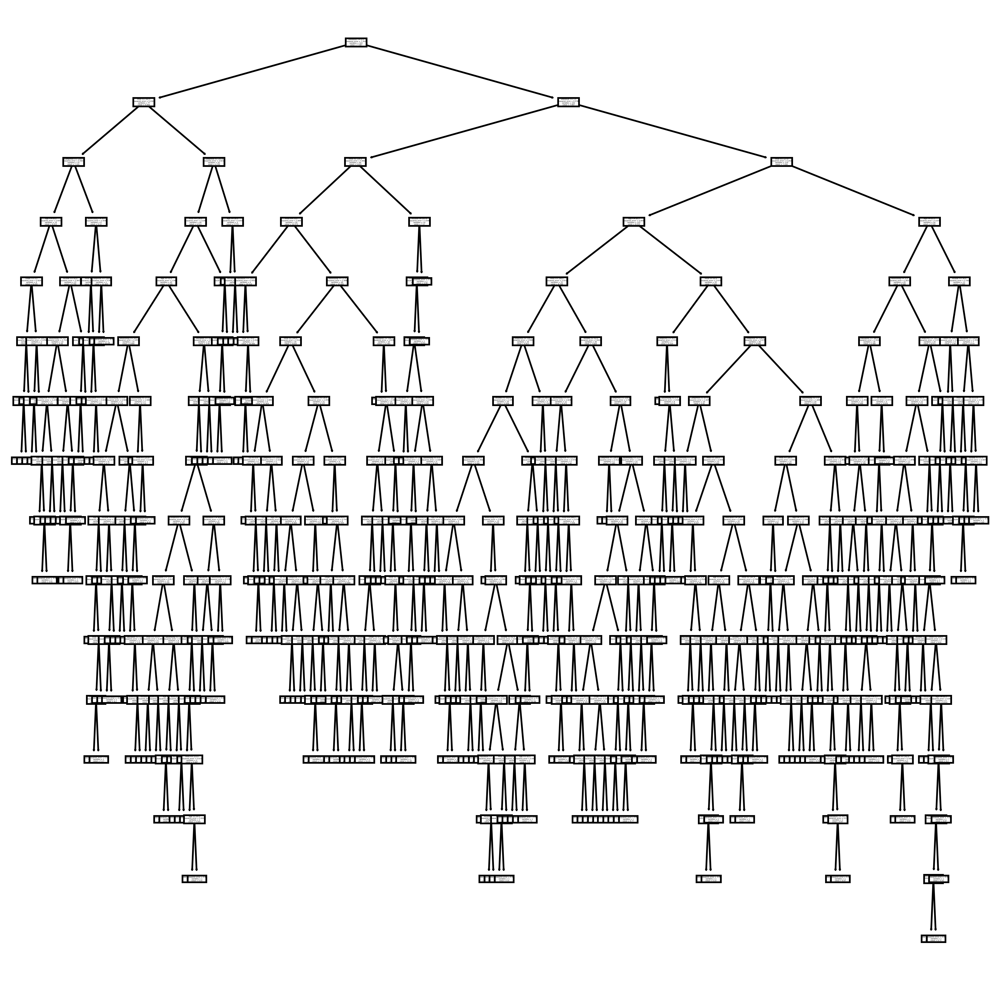

In [60]:
tree.plot_tree(dtr, feature_names=['CompPrice', 'Income', 'Advertising', "Population", "Price", "ShelveLoc", "Age", "Education", "Urban", "US"])
plt.show()

# Hyperparameter tuning

In [61]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [62]:
from sklearn.model_selection import GridSearchCV

In [63]:
params = {
    'criterion' : ['squared_error','absolute_error'],
    'max_depth' : [3,5,7,9,11],
    'splitter' :['best','random']
}

In [64]:
grid = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=params,
                   verbose=1)

In [65]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [3, 5, 7, 9, 11],
                         'splitter': ['best', 'random']},
             verbose=1)

In [66]:
grid.best_params_

{'criterion': 'absolute_error', 'max_depth': 5, 'splitter': 'random'}

In [67]:
dtr = DecisionTreeRegressor(criterion='squared_error',
                           max_depth=5,splitter='random')

In [68]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [69]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(0.5550818867177187, 0.41705225452883476)

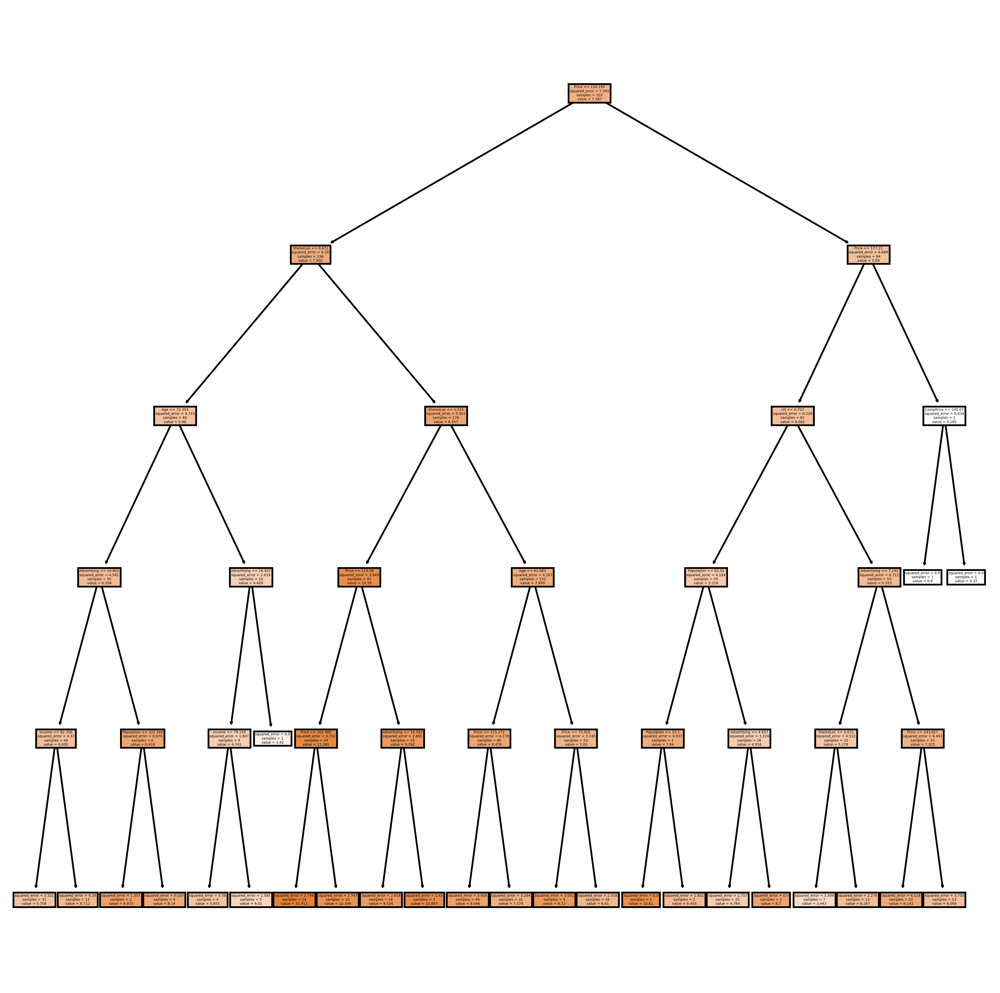

In [70]:
tree.plot_tree(dtr, feature_names=['CompPrice', 'Income', 'Advertising', "Population", "Price", "ShelveLoc", "Age", "Education", "Urban", "US"], filled=True)
plt.show()

# Model Validation

# Train test split

In [71]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120.0,0,42,17,1,1
1,11.22,111,48,16,260,83.0,1,65,10,1,1
2,10.06,113,35,10,269,80.0,2,59,12,1,1
3,7.40,117,100,4,466,97.0,2,55,14,1,1
4,4.15,141,64,3,340,128.0,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128.0,1,33,14,1,1
396,6.14,139,23,3,37,120.0,2,55,11,0,1
397,7.41,162,26,12,368,159.0,2,40,18,1,1
398,5.94,100,79,7,284,95.0,0,50,12,1,1


In [72]:
x = df.iloc[:,1:]
y = df['Sales']

In [73]:
x

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,138,73,11,276,120.0,0,42,17,1,1
1,111,48,16,260,83.0,1,65,10,1,1
2,113,35,10,269,80.0,2,59,12,1,1
3,117,100,4,466,97.0,2,55,14,1,1
4,141,64,3,340,128.0,0,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128.0,1,33,14,1,1
396,139,23,3,37,120.0,2,55,11,0,1
397,162,26,12,368,159.0,2,40,18,1,1
398,100,79,7,284,95.0,0,50,12,1,1


In [74]:
y

0       9.50
1      11.22
2      10.06
3       7.40
4       4.15
       ...  
395    12.57
396     6.14
397     7.41
398     5.94
399     9.71
Name: Sales, Length: 400, dtype: float64

In [75]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2, random_state=42)

In [76]:
dt = DecisionTreeRegressor ()
dt.fit(xtrain,ytrain)
ypred = dt.predict(xtest)
ypred

array([ 6.88,  6.8 , 11.22,  4.1 , 11.7 ,  5.68, 10.96,  8.01, 11.93,
       11.54,  6.54, 10.21,  8.68,  7.32,  9.16,  9.34,  3.58, 12.57,
        6.81,  8.7 ,  9.64,  2.52,  7.91,  6.92,  4.53,  4.69,  8.47,
        7.63,  8.7 ,  4.1 , 12.13, 11.28,  4.69,  4.19, 11.28,  4.2 ,
        5.83, 10.07,  9.09,  4.15,  4.94,  8.7 ,  9.33, 10.  ,  7.02,
        9.32,  7.57,  8.07,  5.87,  4.2 , 11.07,  8.79,  8.57, 11.48,
        7.77,  5.16,  5.47,  8.21, 11.99,  9.09,  7.8 , 11.28,  5.94,
        4.9 ,  7.54,  5.87, 12.29,  8.68,  8.32,  8.89,  8.7 ,  5.87,
        8.01,  5.68, 11.18,  6.97, 10.66,  9.39,  6.2 ,  8.7 ])

In [77]:
dtr.score(xtrain,ytrain), dtr.score(xtest,ytest)

(0.5550818867177187, 0.41705225452883476)

# K-fold Cross Validation

In [79]:
from sklearn.model_selection import train_test_split, KFold, LeaveOneOut,cross_val_score

In [80]:
kf = KFold(n_splits=10)

scores = cross_val_score(DecisionTreeRegressor(),x,y, cv = kf)

In [81]:
scores

array([0.51930732, 0.37122388, 0.10179417, 0.43688718, 0.17335911,
       0.62014935, 0.0624526 , 0.39931377, 0.35392462, 0.21795509])

In [82]:
scores.mean()

0.32563670982845894